# About the Dataset



The **Synthetic Employee Attrition Dataset** is a simulated dataset designed for the analysis and prediction of employee attrition. It includes detailed information about various aspects of an employee's profile, such as demographics, job-related features, and personal circumstances.

The dataset comprises **74,498 samples**, split into training and testing sets to facilitate model development and evaluation. Each record includes a unique Employee ID and features that influence employee attrition. The goal is to understand the factors contributing to attrition and develop predictive models to identify at-risk employees.

This dataset is ideal for:
- **HR Analytics**: Identifying factors leading to employee turnover.
- **Machine Learning Model Development**: Building predictive models for attrition.
- **Advanced Data Analysis**: Demonstrating data analysis techniques.

It provides a comprehensive and realistic view of the factors affecting employee retention, making it a valuable resource for researchers and practitioners in the field of human resources and organizational development.

## Features

1. **Employee ID**: A unique identifier assigned to each employee.
2. **Age**: The age of the employee, ranging from 18 to 60 years.
3. **Gender**: The gender of the employee.
4. **Years at Company**: The number of years the employee has been working at the company.
5. **Monthly Income**: The monthly salary of the employee, in dollars.
6. **Job Role**: The department or role the employee works in, encoded into categories such as Finance, Healthcare, Technology, Education, and Media.
7. **Work-Life Balance**: The employee's perceived balance between work and personal life. Categories: `Poor`, `Below Average`, `Good`, `Excellent`.
8. **Job Satisfaction**: The employee's satisfaction with their job. Categories: `Very Low`, `Low`, `Medium`, `High`.
9. **Performance Rating**: The employee's performance rating. Categories: `Low`, `Below Average`, `Average`, `High`.
10. **Number of Promotions**: The total number of promotions the employee has received.
11. **Distance from Home**: The distance between the employee's home and workplace, in miles.
12. **Education Level**: The highest education level attained by the employee. Categories: `High School`, `Associate Degree`, `Bachelor’s Degree`, `Master’s Degree`, `PhD`.
13. **Marital Status**: The marital status of the employee. Categories: `Divorced`, `Married`, `Single`.
14. **Job Level**: The job level of the employee. Categories: `Entry`, `Mid`, `Senior`.
15. **Company Size**: The size of the company the employee works for. Categories: `Small`, `Medium`, `Large`.
16. **Company Tenure**: The total number of years the employee has been working in the industry.
17. **Remote Work**: Whether the employee works remotely. Categories: `Yes`, `No`.
18. **Leadership Opportunities**: Whether the employee has leadership opportunities. Categories: `Yes`, `No`.
19. **Innovation Opportunities**: Whether the employee has opportunities for innovation. Categories: `Yes`, `No`.
20. **Company Reputation**: The employee's perception of the company's reputation. Categories: `Very Poor`, `Poor`, `Good`, `Excellent`.
21. **Employee Recognition**: The level of recognition the employee receives. Categories: `Very Low`, `Low`, `Medium`, `High`.
22. **Attrition**: Whether the employee has left the company, encoded as `0` (stayed) and `1` (left).

# Reading Data

In [47]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('data_raw.csv')
df.head().T

,0,1,2,3,4
Employee ID,8410,64756,30257,65791,65026
Age,31,59,24,36,56
Gender,Male,Female,Female,Female,Male
Years at Company,19,4,10,7,41
Job Role,Education,Media,Healthcare,Education,Education
Monthly Income,5390,5534,8159,3989,4821
Work-Life Balance,Excellent,Poor,Good,Good,Fair
Job Satisfaction,Medium,High,High,High,Very High
Performance Rating,Average,Low,Low,High,Average
Number of Promotions,2,3,0,1,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59598 entries, 0 to 59597
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Employee ID               59598 non-null  int64 
 1   Age                       59598 non-null  int64 
 2   Gender                    59598 non-null  object
 3   Years at Company          59598 non-null  int64 
 4   Job Role                  59598 non-null  object
 5   Monthly Income            59598 non-null  int64 
 6   Work-Life Balance         59598 non-null  object
 7   Job Satisfaction          59598 non-null  object
 8   Performance Rating        59598 non-null  object
 9   Number of Promotions      59598 non-null  int64 
 10  Overtime                  59598 non-null  object
 11  Distance from Home        59598 non-null  int64 
 12  Education Level           59598 non-null  object
 13  Marital Status            59598 non-null  object
 14  Number of Dependents  

In [7]:
df.drop('Employee ID', axis=1, inplace=True)

In [8]:
df.duplicated().sum()

0

In [11]:
df.isna().sum().sum()

0

In [24]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.to_list()
print('Numneric columns:', num_cols)

cat_cols = df.select_dtypes(include=['object']).columns.to_list()
print('Categorical columns:', cat_cols)

Numneric columns: ['Age', 'Years at Company', 'Monthly Income', 'Number of Promotions', 'Distance from Home', 'Number of Dependents', 'Company Tenure']
Categorical columns: ['Gender', 'Job Role', 'Work-Life Balance', 'Job Satisfaction', 'Performance Rating', 'Overtime', 'Education Level', 'Marital Status', 'Job Level', 'Company Size', 'Remote Work', 'Leadership Opportunities', 'Innovation Opportunities', 'Company Reputation', 'Employee Recognition', 'Attrition']


In [13]:
pd.options.display.float_format = '{:.2f}'.format
df.describe()

,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure
count,59598.00,59598.00,59598.00,59598.00,59598.00,59598.00,59598.00
mean,38.57,15.75,7302.40,0.83,50.01,1.65,55.76
std,12.08,11.25,2151.46,0.99,28.47,1.56,25.41
min,18.00,1.00,1316.00,0.00,1.00,0.00,2.00
25%,28.00,7.00,5658.00,0.00,25.00,0.00,36.00
50%,39.00,13.00,7354.00,1.00,50.00,1.00,56.00
75%,49.00,23.00,8880.00,2.00,75.00,3.00,76.00
max,59.00,51.00,16149.00,4.00,99.00,6.00,128.00


In [14]:
df.describe(include=['object'])

,Gender,Job Role,Work-Life Balance,Job Satisfaction,Performance Rating,Overtime,Education Level,Marital Status,Job Level,Company Size,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
count,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598,59598
unique,2,5,4,4,4,2,5,3,3,3,2,2,2,4,4,2
top,Male,Technology,Good,High,Average,No,Bachelor’s Degree,Married,Entry,Medium,No,No,No,Good,Low,Stayed
freq,32739,15507,22528,29779,35810,40148,17826,29908,23867,29745,48239,56680,49895,29766,23758,31260


# Univariate Analysis

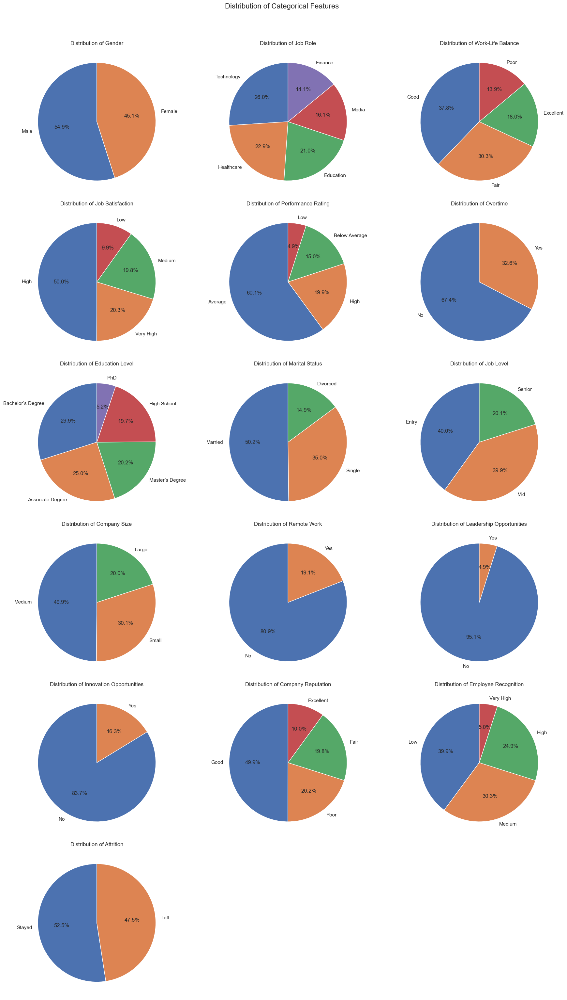

In [26]:
# Determine the number of rows needed for 3 plots per row
n_cols = 3  # Number of plots per row
n_rows = (len(cat_cols) + n_cols - 1) // n_cols  # Compute number of rows needed

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 5))
fig.suptitle('Distribution of Categorical Features', fontsize=16, y=1.02)

# Flatten axes for easy iteration if n_rows > 1
axes = axes.flatten() if n_rows > 1 else [axes]

# Plot each categorical column as a pie chart
for i, col in enumerate(cat_cols):
    # Get counts and plot pie chart
    counts = df[col].value_counts()
    axes[i].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90)
    axes[i].set_title(f'Distribution of {col}')
    
# Remove any empty subplots if the number of categorical columns is not a multiple of 3
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [31]:
for col in num_cols:
    fig = px.histogram(df, x=col, marginal="box", title=f"Distribution of {col}")
    fig.show()

In [32]:
df[df['Monthly Income'] > 14000].count()

Age                         33
Gender                      33
Years at Company            33
Job Role                    33
Monthly Income              33
Work-Life Balance           33
Job Satisfaction            33
Performance Rating          33
Number of Promotions        33
Overtime                    33
Distance from Home          33
Education Level             33
Marital Status              33
Number of Dependents        33
Job Level                   33
Company Size                33
Company Tenure              33
Remote Work                 33
Leadership Opportunities    33
Innovation Opportunities    33
Company Reputation          33
Employee Recognition        33
Attrition                   33
dtype: int64

In [36]:
pd.options.display.float_format = '{:.3f}'.format
df['Monthly Income'].quantile([0.8, 0.9, 0.95, 0., 0.995, 0.999])

0.800    9213.000
0.900   10107.000
0.950   10806.000
0.000    1316.000
0.995   12621.000
0.999   13595.403
Name: Monthly Income, dtype: float64

In [37]:
def remove_outliers(df, col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

df = remove_outliers(df, 'Monthly Income')

In [38]:
px.histogram(df, x='Monthly Income', marginal="box", title="Distribution of Monthly Income")

In [39]:
df = remove_outliers(df, 'Years at Company')

In [40]:
px.histogram(df, x='Years at Company', marginal="box", title="Distribution of Years at Company")

# Bivariate Analysis

In [41]:
df['Attrition'].value_counts()

Attrition
Stayed    31072
Left      28203
Name: count, dtype: int64

In [42]:
df['Attrition'] = df['Attrition'].map({'Left': 1, 'Stayed': 0})

In [44]:
cat_cols.remove('Attrition')
cat_cols

['Gender',
 'Job Role',
 'Work-Life Balance',
 'Job Satisfaction',
 'Performance Rating',
 'Overtime',
 'Education Level',
 'Marital Status',
 'Job Level',
 'Company Size',
 'Remote Work',
 'Leadership Opportunities',
 'Innovation Opportunities',
 'Company Reputation',
 'Employee Recognition']

In [45]:
global_mean = df['Attrition'].mean()
global_mean

0.4757992408266554

In [51]:
interested_cols = cat_cols+ ['Number of Promotions', 'Number of Dependents']

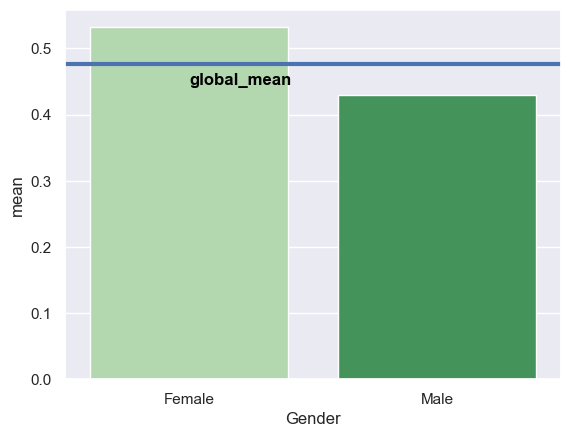

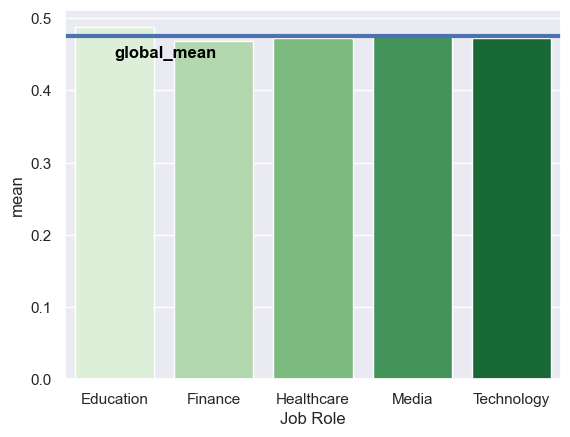

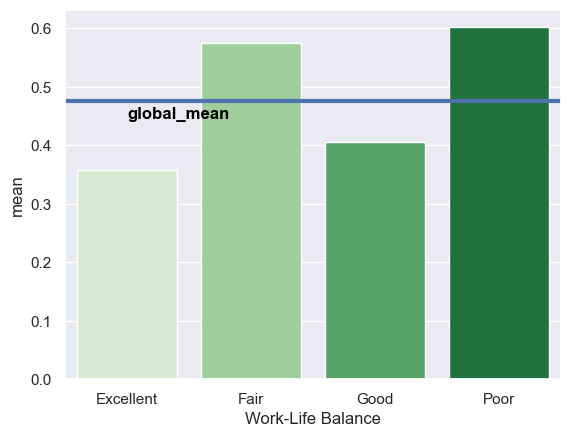

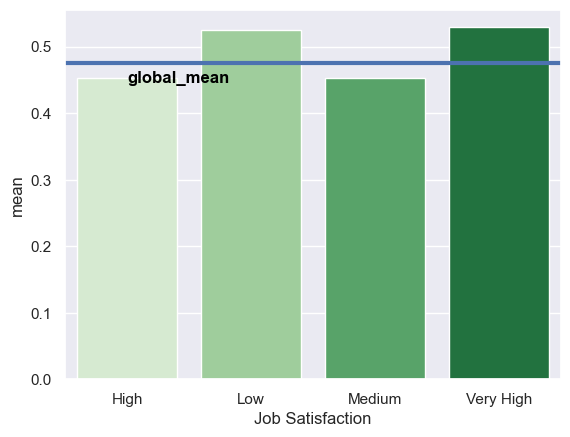

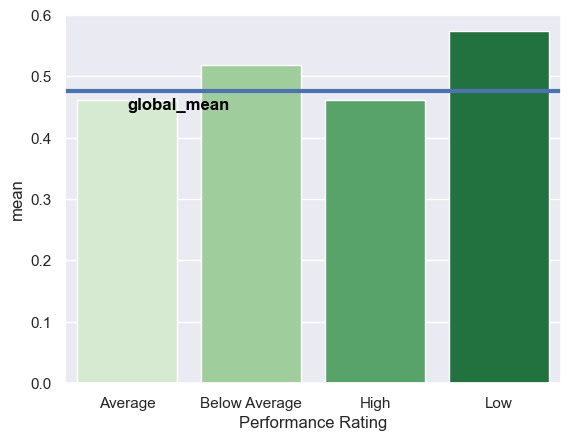

...

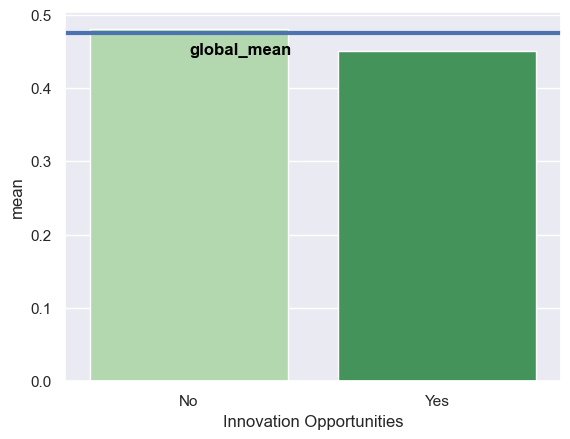

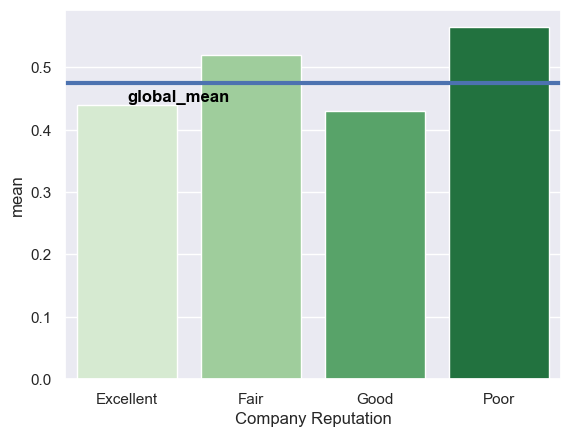

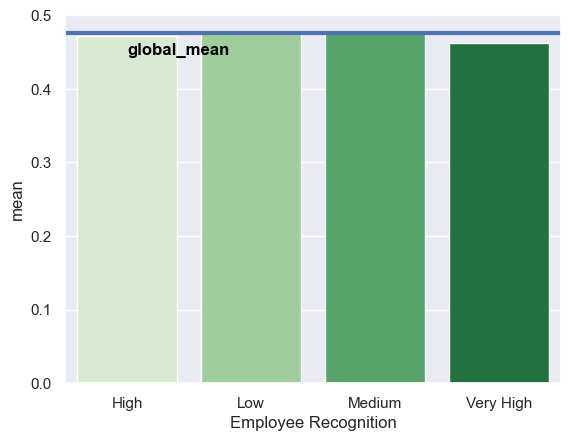

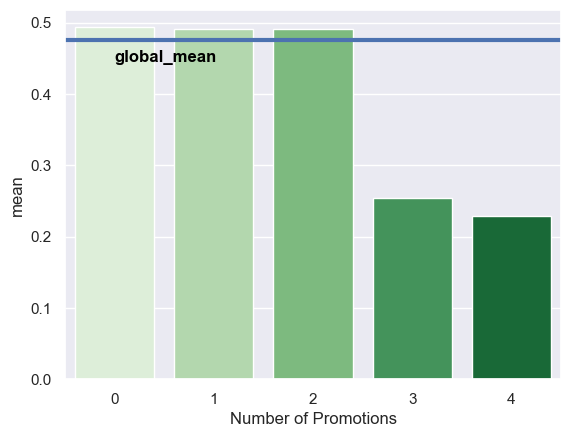

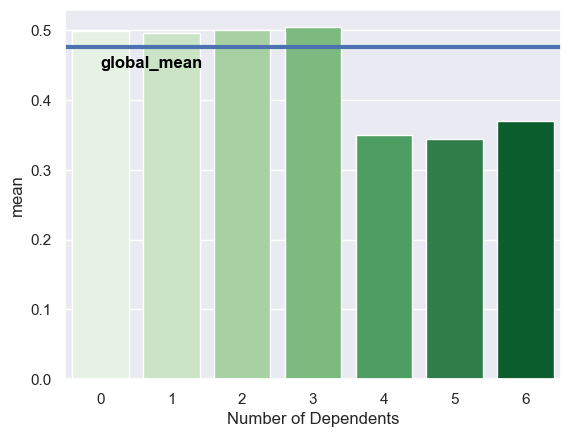

In [53]:
for feature in interested_cols:                                           
    df_group = df.groupby(by=feature).Attrition.agg(['mean']).reset_index()
    graph=sns.barplot(x= feature, y = 'mean', data=df_group, palette='Greens')
    graph.axhline(global_mean, linewidth=3, color='b')
    plt.text(0, global_mean - 0.03, "global_mean", color='black', weight='semibold')
    plt.show()

<Axes: xlabel='Monthly Income', ylabel='Density'>

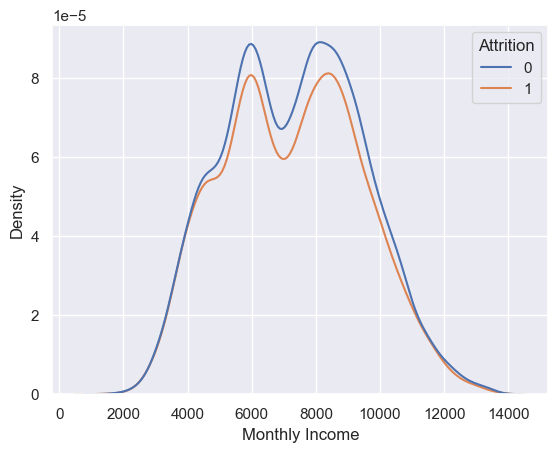

In [60]:
sns.kdeplot(x='Monthly Income', data=df, hue='Attrition')

In [61]:
fig = px.histogram(df, x='Monthly Income', marginal="box", color="Attrition", title=f"Distribution of {col}")
fig.show()

In [63]:
df.corr(numeric_only=True, method='spearman')

,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure,Attrition
Age,1.000,0.500,-0.002,-0.002,-0.007,0.003,0.216,-0.048
Years at Company,0.500,1.000,-0.004,0.001,-0.005,0.003,0.400,-0.074
Monthly Income,-0.002,-0.004,1.000,0.008,-0.003,0.004,-0.005,-0.012
Number of Promotions,-0.002,0.001,0.008,1.000,-0.006,-0.001,0.003,-0.060
Distance from Home,-0.007,-0.005,-0.003,-0.006,1.000,0.001,-0.004,0.096
Number of Dependents,0.003,0.003,0.004,-0.001,0.001,1.000,0.001,-0.066
Company Tenure,0.216,0.400,-0.005,0.003,-0.004,0.001,1.000,-0.028
Attrition,-0.048,-0.074,-0.012,-0.060,0.096,-0.066,-0.028,1.000


# Preparing the data for modelling

In [64]:
df.columns

Index(['Age', 'Gender', 'Years at Company', 'Job Role', 'Monthly Income',
       'Work-Life Balance', 'Job Satisfaction', 'Performance Rating',
       'Number of Promotions', 'Overtime', 'Distance from Home',
       'Education Level', 'Marital Status', 'Number of Dependents',
       'Job Level', 'Company Size', 'Company Tenure', 'Remote Work',
       'Leadership Opportunities', 'Innovation Opportunities',
       'Company Reputation', 'Employee Recognition', 'Attrition'],
      dtype='object')

In [84]:
df2 = df.copy()

In [85]:
to_neglect = ['Job Role', 'Company Size', 'Innovation Opportunities', 'Leadership Opportunities', 'Employee Recognition']
df2.drop(to_neglect, axis=1, inplace=True)

In [86]:
df2.columns

Index(['Age', 'Gender', 'Years at Company', 'Monthly Income',
       'Work-Life Balance', 'Job Satisfaction', 'Performance Rating',
       'Number of Promotions', 'Overtime', 'Distance from Home',
       'Education Level', 'Marital Status', 'Number of Dependents',
       'Job Level', 'Company Tenure', 'Remote Work', 'Company Reputation',
       'Attrition'],
      dtype='object')

In [88]:
def categorize_dependents(x):
    if x <= 3:
        return 'low'
    else:
        return 'high'
    
df2['Number of Dependents'] = df2['Number of Dependents'].map(categorize_dependents)

In [91]:
def categorize_promotions(x):
    if x <= 2:
        return 'low'
    else:
        return 'high'
    
df2['Number of Promotions'] = df2['Number of Promotions'].map(categorize_promotions)

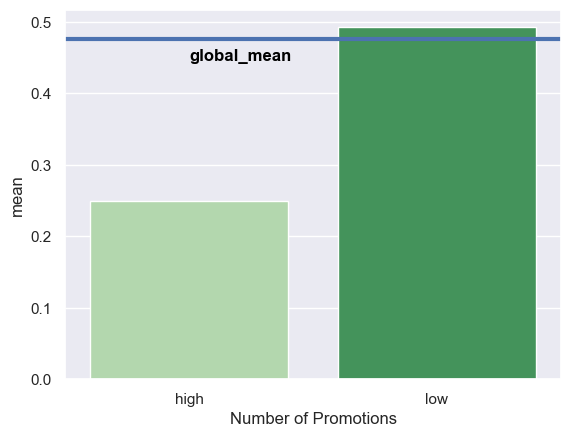

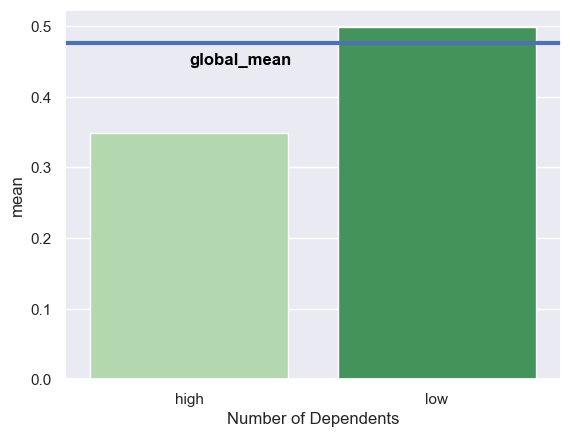

In [93]:
for feature in ['Number of Promotions', 'Number of Dependents']:                                           
    df_group = df2.groupby(by=feature).Attrition.agg(['mean']).reset_index()
    graph=sns.barplot(x= feature, y = 'mean', data=df_group, palette='Greens')
    graph.axhline(global_mean, linewidth=3, color='b')
    plt.text(0, global_mean - 0.03, "global_mean", color='black', weight='semibold')
    plt.show()

In [96]:
df2.corr(numeric_only=True)['Attrition']

Age                  -0.048
Years at Company     -0.064
Monthly Income       -0.012
Distance from Home    0.095
Company Tenure       -0.029
Attrition             1.000
Name: Attrition, dtype: float64

In [97]:
df2.drop(['Years at Company', 'Company Tenure'], axis=1, inplace=True)

In [98]:
df2.sample()

,Age,Gender,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,Distance from Home,Education Level,Marital Status,Number of Dependents,Job Level,Remote Work,Company Reputation,Attrition
20194,19,Female,11072,Good,Very High,Below Average,low,No,12,Bachelor’s Degree,Married,high,Mid,Yes,Fair,0


In [99]:
df2.to_csv('data_cleaned.csv', index=False)